# Project 5: Vehicle Detection and Tracking  
### This project will create a software pipeline to detect vehicles in a video from a single camera.

## Project Goals / Deliverables  
The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier  
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector.  
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.  
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.  
* Run your pipeline on project_video.mp4 and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.


In [1]:
import numpy as np
import cv2
import glob
import time
import pickle
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

from skimage.feature import hog
from mpl_toolkits.mplot3d import Axes3D

from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.cross_validation import StratifiedShuffleSplit

from sklearn.svm import LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

from sklearn.learning_curve import learning_curve
from sklearn.learning_curve import validation_curve
from sklearn.feature_selection import RFECV, RFE
from scipy.ndimage.measurements import label

import sklearn
print('The scikit-learn version is {}.'.format(sklearn.__version__))

import sys
print(sys.version)

The scikit-learn version is 0.17.1.
3.5.2 |Anaconda 4.2.0 (64-bit)| (default, Jul  5 2016, 11:41:13) [MSC v.1900 64 bit (AMD64)]


## Data Exploration

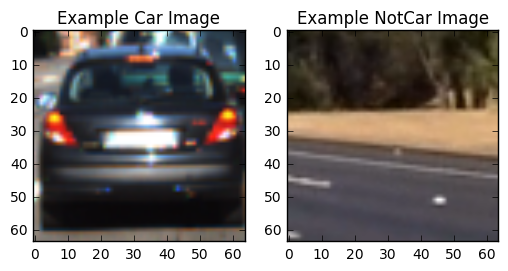

Number of Cars: 8792
Number of NotCars: 8968 

Shape: (64, 64, 3)
Data Type: float32
Average Value 0.291191


In [2]:
def get_data():
    return cars, notcars, car, notcar

if (1): cars, notcars, car, notcar = get_data()

## Manual Vehicle Detection

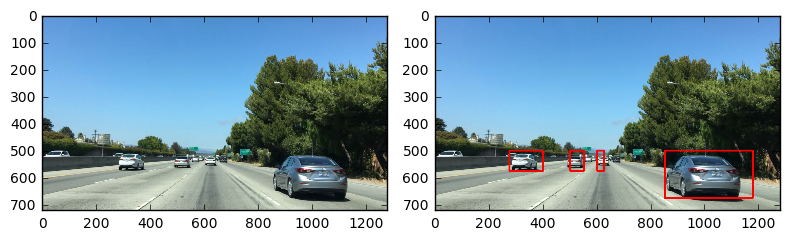

In [3]:
def draw_boxes(img, bboxes, color=(255,0,0), thick=6):
    return draw_img

def show_draw_boxes():
    return None

if (1): show_draw_boxes()

## Color Histograms

Machine Learning features can be created from images using Color Histograms. These histograms are created from color values in an image which are then compared with regions of test images. Locations with similar color distributions will reveal a close match as will objects in slightly different orientations. Variations in image size can also be accommodated by normalizing the histograms.

This project uses bin sizes of 4, 8, 16 and 32 for feature creation to take advantage of different scaling. The color histogram function used to coded to be called multiple times (one for each bin size). This was rewritten to return a single combined feature vector for all bin sizes. This change resulted in 10% faster training time for this feature.

**hist_features = color_hist(image, nbins=histbin)**

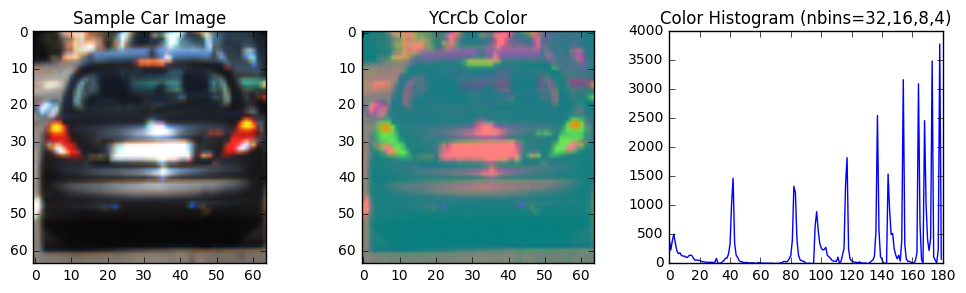

Color Histogram - Feature Vector (length): (180,)


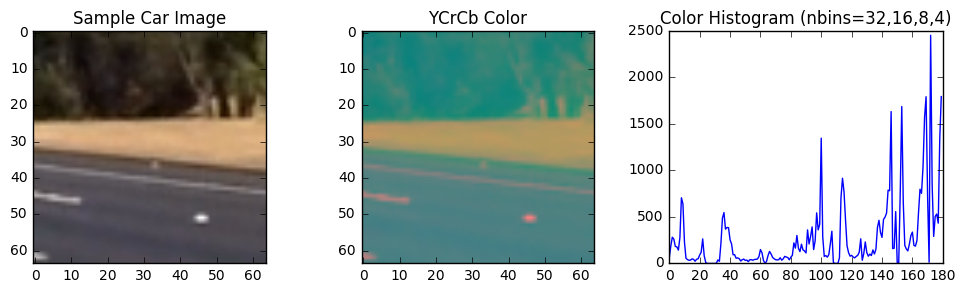

Color Histogram - Feature Vector (length): (180,)


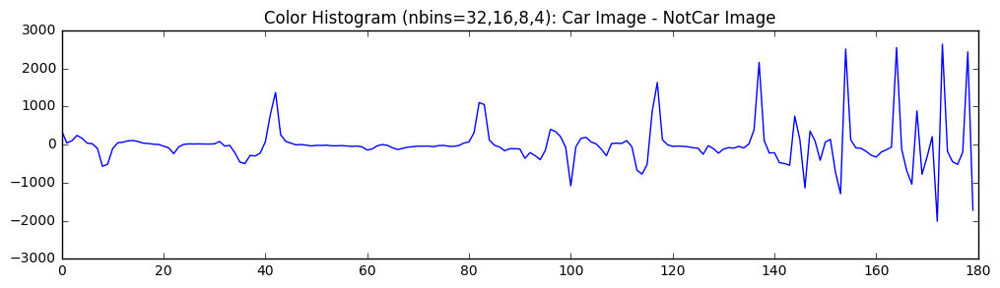

In [4]:
def color_hist(img, nbins=32):    
    return hist_features

def show_color_hist(img, histbin=32):   
    return hist_features

if (1): car_hist = show_color_hist(car, histbin=32)
if (1): notcar_hist = show_color_hist(notcar, histbin=32)

# display the signal from the differences in feature vectors for sample car and not car images
delta = []
for i in range(len(car_hist)): delta.append(car_hist[i] - notcar_hist[i])
plt.figure(figsize=(12,3))
plt.plot(delta)
plt.title('Color Histogram (nbins=32,16,8,4): Car Image - NotCar Image')
plt.show()

## Spatial Binning

Machine Learning features can be created from images using Spatial Binning. This simple technique resizes images to small sizes which are then flattened into 1-D arrays for the feature vector. This project uses spatial sizes of 4, 8, and 16 for feature creation to take advantage of different scaling.

**spatial_features = cv2.resize(img, (spatial,spatial)).ravel()**

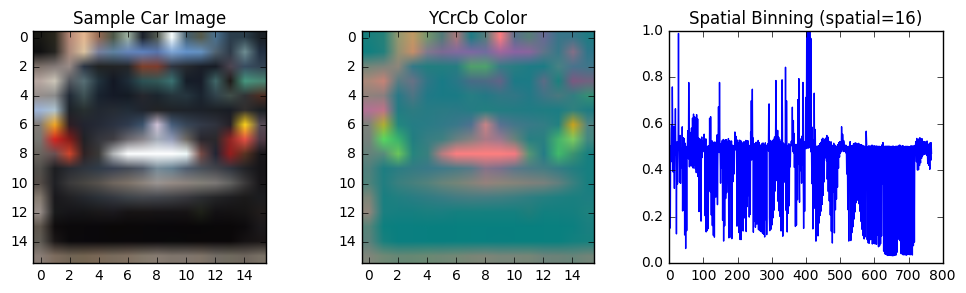

Spatial Binning of Color - Feature Vector (length): (768,)


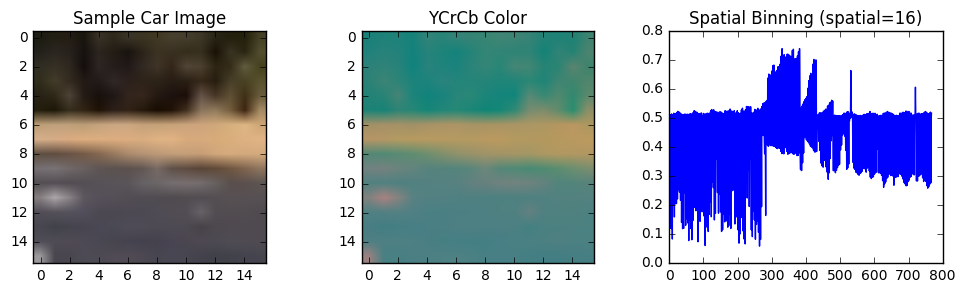

Spatial Binning of Color - Feature Vector (length): (768,)


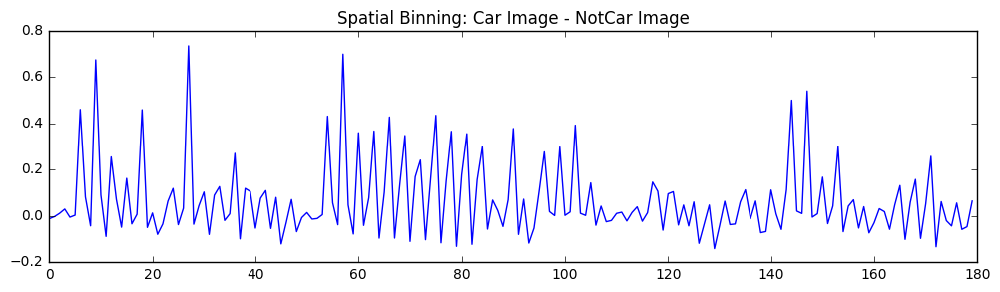

In [5]:
def bin_spatial(img, spatial=32):
    return spatial_features

def show_bin_spatial(img, spatial=32):
    return spatial_features

if (1): car_spatial = show_bin_spatial(car, spatial=16)
if (1): notcar_spatial = show_bin_spatial(notcar, spatial=16)

# display the signal from the differences in feature vectors for sample car and not car images
delta = []
for i in range(len(car_hist)): delta.append(car_spatial[i] - notcar_spatial[i])
plt.figure(figsize=(12,3))
plt.plot(delta)
plt.title('Spatial Binning: Car Image - NotCar Image')
plt.show()

## Histogram of Oriented Gradients (HOG)

Machinne Learning features can also be created from image gradients, since edges can give a more robust presentation of objects. Image gradients are calculated from grid cells which are then flattened into 1-D arrays. Using gradient values directly will make the signature too sensitive, so the normal implementation uses the histogram of gradients for each cell. This is referred to as Histogram of Oriented Gradients (HOG).

The orient parameter can be varied from 6 to 12, with the best results seen using a value of 8. This makes sense since cars are mostly horizontal, vertical and diagonal lines. Pixels per cell and cells per block have a huge influence on run time. The best balance of run time and accuracy were found with values of 16 and 2 respectively. The transform sqrt parameter normalizes the images with power law compression before processing. This parameter does seem to help with shadows. 

The images below show sample images (car and not-car), HOG Visualization of gradients and the associated HOG Feature Vectors. The bottom image shows the signal generated resuting from the difference of feature vectors for these sample images.  

**hog_features, hog_image = \     
hog(img, orient, (pix_per_cell,pix_per_cell), (cell_per_block,cell_per_block), visualise, transform_sqrt, feature_vector) **

ref: HOG for pedestrian detection - https://www.youtube.com/watch?v=7S5qXET179I  
ref: original paper for HOG - http://lear.inrialpes.fr/people/triggs/pubs/Dalal-cvpr05.pdf  
ref: wiki - http://en.wikipedia.org/wiki/Histogram_of_oriented_gradients  

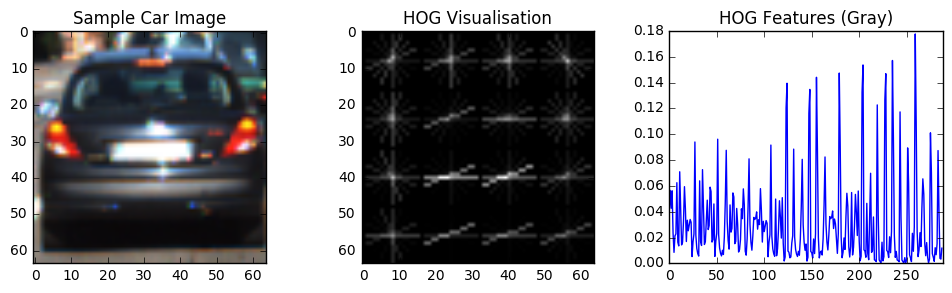

Histogram of Oriented Gradients - Feature Vector (length): (288,)


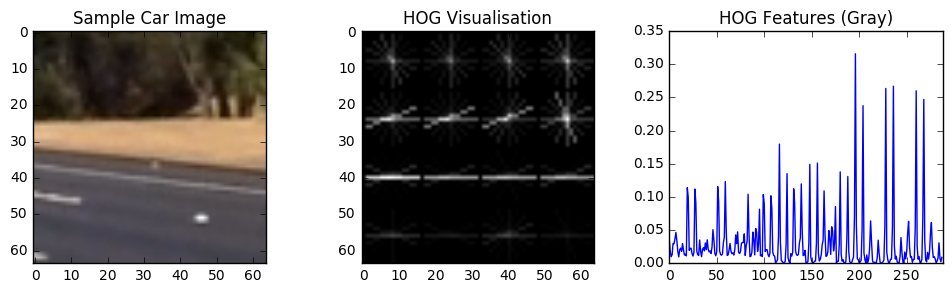

Histogram of Oriented Gradients - Feature Vector (length): (288,)


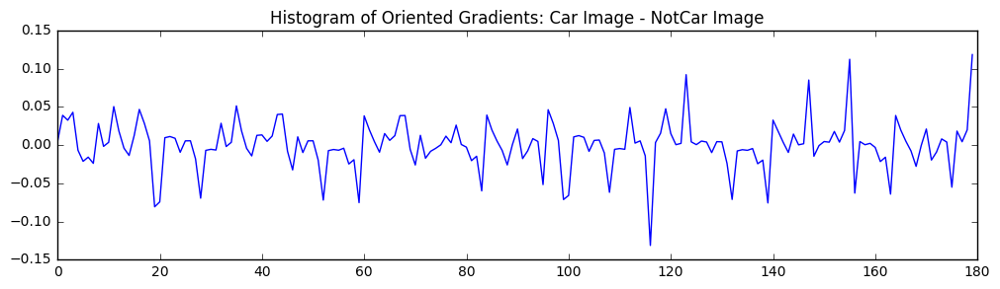

In [6]:
def get_hog_features(img, orient=9, pix_per_cell=8, cell_per_block=3, transform_sqrt=False, feature_vector=True):
    return hog_features, hog_image

def show_hog_features(img, orient, pix_per_cell, cell_per_block, transform_sqrt):   
    return hog_features

# parameters
orient = 8 # 12
pix_per_cell = 16 # 16
cell_per_block = 2 # 1
transform_sqrt = True # True

if (1): car_hog_feat = show_hog_features(car, orient, pix_per_cell, cell_per_block, transform_sqrt)
if (1): notcar_hog_feat = show_hog_features(notcar, orient, pix_per_cell, cell_per_block, transform_sqrt)

# display the signal from the differences in feature vectors for sample car and not car images
delta = []
for i in range(len(car_hist)): delta.append(car_hog_feat[i] - notcar_hog_feat[i])
plt.figure(figsize=(12,3))
plt.plot(delta)
plt.title('Histogram of Oriented Gradients: Car Image - NotCar Image')
plt.show()

## Feature Extraction

In [7]:
def get_hog_features(img, orient=9, pix_per_cell=8, cell_per_block=3, transform_sqrt=False, feature_vector=True):
    return hog_features

def extract_features(imgs):   
    return features

def scale_features(scaler = 'standard'):
    return X_scaler, X, y, scaled_X

if (1): X_scaler, X, y, scaled_X = scale_features(scaler = 'standard')

Feature Extraction...
82.54 Seconds for Feature Extraction...
Done!

X Shape: (17760, 2052)
scaled_X Shape: (17760, 2052)


## Normalize Features

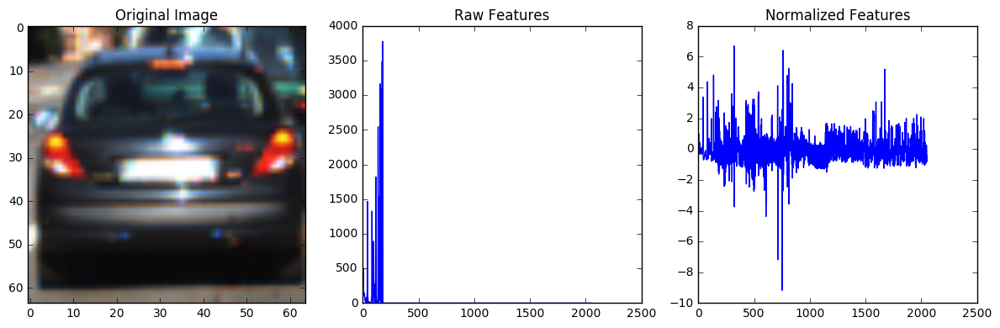

Normalized Features - Feature Vector (length): (17760, 2052)


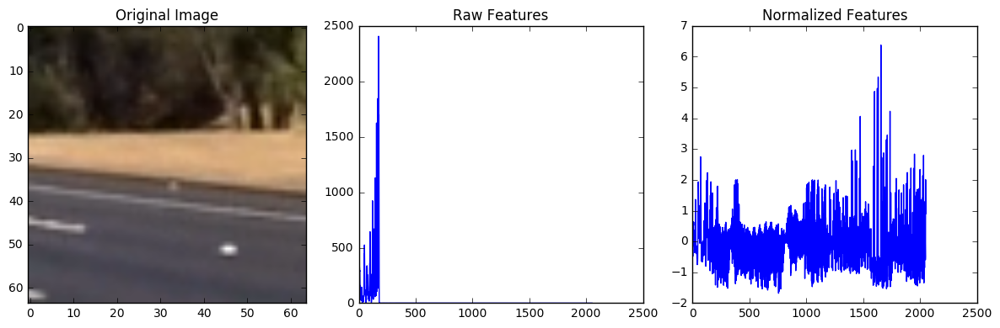

Normalized Features - Feature Vector (length): (17760, 2052)


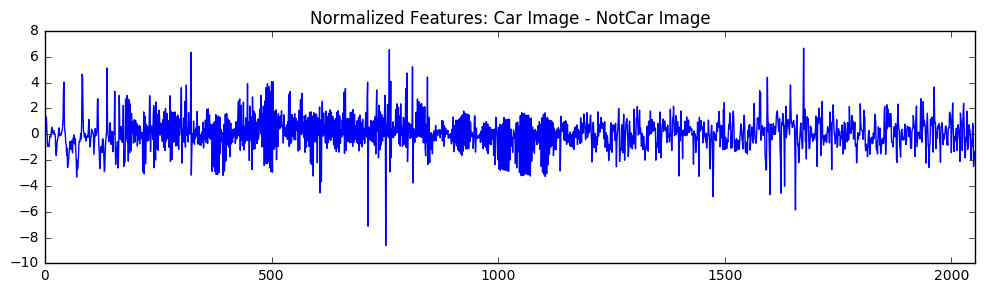

In [8]:
def show_norm_features():
    return None

if (1): show_norm_features()
X = scaled_X

## Learning Curve

Learning Curves plot Training Scores and Cross Validation Scores for a variety of sample sizes. They are great for deciding if we have enough data and then selecting the best classifier model. This project uses the learning curve function. CV sets are generated with Stratified Shuffle Split for randomization and to preserve the percentage of samples for each class.

The results for Naïve Bayes, Random Forest and Linear SVC show that the curves converge rapidly, so we do have enough data. Linear SVC easily has the highest CV accuracy out of all the models (99%) with run times that are moderately fast.

**cv = StratifiedShuffleSplit(y=y, n_iter=3, test_size=0.2, random_state=0)**  

**train_sizes, train_scores, test_scores = learning_curve(estimator, X, y,  train_sizes=train_sizes, cv=cv, n_jobs=4)**  

Plotting Learning Curve...
14.83 Seconds to Plot Learning Curve...
Done!


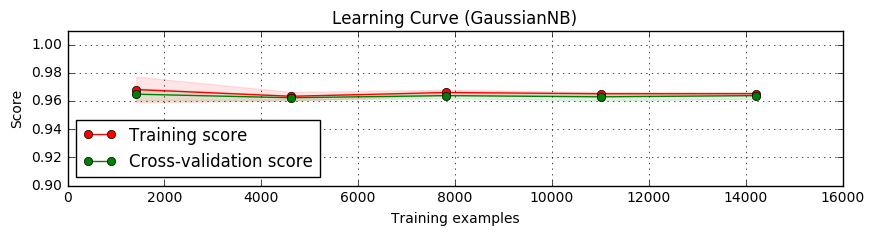

Plotting Learning Curve...
29.55 Seconds to Plot Learning Curve...
Done!


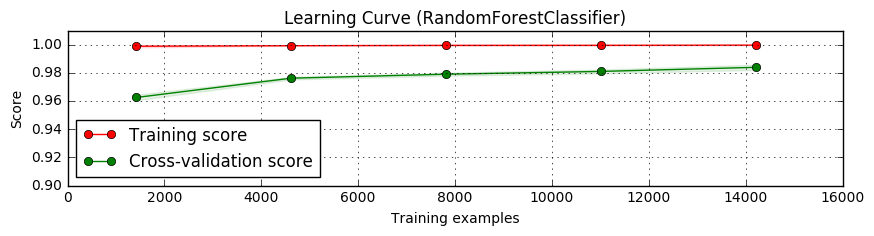

Plotting Learning Curve...
25.08 Seconds to Plot Learning Curve...
Done!


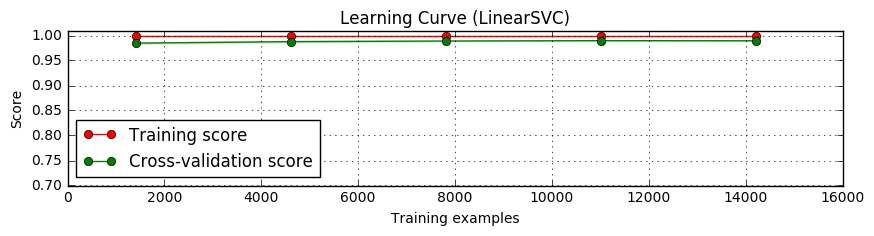

In [9]:
def plot_learning_curve(estimator, title, X, y, ylim=None):    
    return None

if (1):   
    clf = GaussianNB()
    plot_learning_curve(clf, 'GaussianNB', X, y, ylim=(0.90, 1.01))
    clf = RandomForestClassifier()
    plot_learning_curve(clf, 'RandomForestClassifier', X, y, ylim=(0.90, 1.01))
    clf = LinearSVC(C=1.0)
    plot_learning_curve(clf,'LinearSVC', X, y, ylim=(0.70, 1.01))

## Complexity Curve

Complexity Curves plot Training Scores and Cross Validation Scores for variety of parameter ranges.  
They are great for optimizing the parameters for a particular classifier.  

**cv = StratifiedShuffleSplit(y=y, n_iter=3, test_size=0.2, random_state=0)**  
    
**train_scores, test_scores = \**  
**validation_curve(clf, X, y, param_name = "C", param_range = param_range, cv = cv)**  

Model Complexity...


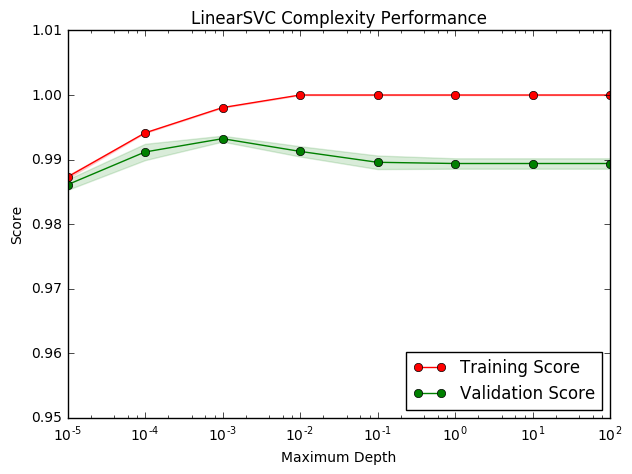

64.78 Seconds for Feature Selection...
Done!


In [10]:
def ModelComplexity(X, y):
    return None

if (1): ModelComplexity(X, y)

## Feature Selection

Recursive Feature Elimination with Cross Validation was used to select the optimal number of features.  

**cv = StratifiedShuffleSplit(y=y, n_iter=1, test_size=0.2, random_state=0)**  

**rfecv = RFECV(clf,step,cv,verbose=2)**  

Feature Selection...
Fitting estimator with 2052 features.
Fitting estimator with 1952 features.
Fitting estimator with 1852 features.
Fitting estimator with 1752 features.
Fitting estimator with 1652 features.
Fitting estimator with 1552 features.
Fitting estimator with 1452 features.
Fitting estimator with 1352 features.
Fitting estimator with 1252 features.
Fitting estimator with 1152 features.
Fitting estimator with 1052 features.
Fitting estimator with 952 features.
Fitting estimator with 852 features.
Fitting estimator with 752 features.
Fitting estimator with 652 features.
Fitting estimator with 552 features.
Fitting estimator with 452 features.
Fitting estimator with 352 features.
Fitting estimator with 252 features.
Fitting estimator with 152 features.
Fitting estimator with 52 features.


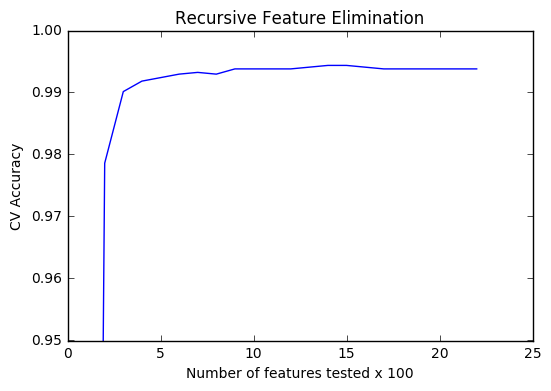


Max CV Score:  0.994

X Shape: (17760, 2052)
X_New Shape: (17760, 1252) 

47.16 Seconds for Feature Selection...
Done!


In [11]:
def feature_selection(X, y, step, n_select):  
    return rfecv, X_new

if (1): rfecv, X_new = feature_selection(X, y, step=100, n_select=800)

## Complexity Curve

Complexity Curve was repeated to verify that the optimal classifier parameters have not changed after Feature Selection.

Model Complexity...


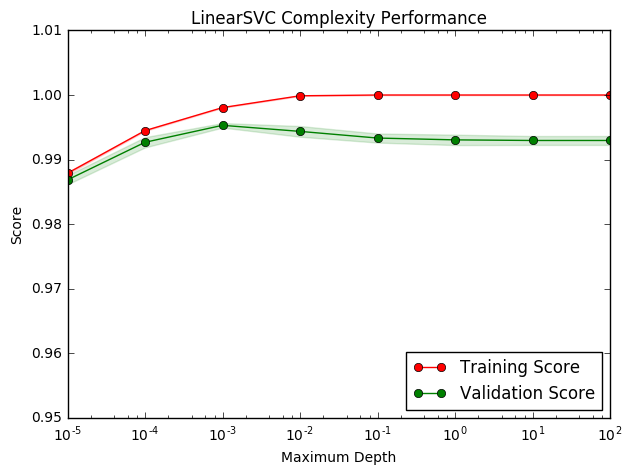

55.0 Seconds for Feature Selection...
Done!


In [12]:
def ModelComplexity(X, y):
    return None

if (1): ModelComplexity(X_new, y)

## Model Testing

In [13]:
sss = StratifiedShuffleSplit(y=y, n_iter=3, test_size=0.2, random_state=0)
for train_index, test_index in sss:
    X_train, X_test = X_new[train_index], X_new[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
print ('Training set:',X_train.shape)
print ('Testing set:',X_test.shape,'\n')

# creating new classifier with optimized settings
svc = LinearSVC(C=0.001) 
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')

print('\nTrain Accuracy of SVC = ', round(svc.score(X_train, y_train), 4))
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

# training svc with full dataset for sliding window search
svc = svc.fit(X_new, y) 

Training set: (14208, 1252)
Testing set: (3552, 1252) 

0.69 Seconds to train SVC...

Train Accuracy of SVC =  0.998
Test Accuracy of SVC =  0.9952


## Decision Function Calibration

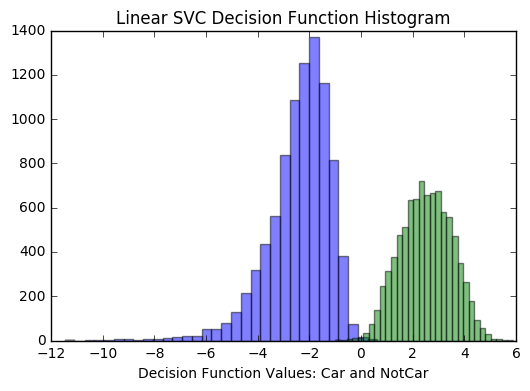

Car: mean (dec_func) =  2.51
Car: std (dec_func) =  0.99 

Decision Function Threshold (97.5%) =  0.53


In [14]:
# calibrating decision function
pred_0, pred_1 = [], []
dec_func = svc.decision_function(X_new)
for i in range(len(X_new)):
    if y[i] == 0: pred_0.append(dec_func[i])
    elif y[i] == 1: pred_1.append(dec_func[i])
        
bins = 32
plt.title('Linear SVC Decision Function Histogram')
plt.xlabel('Decision Function Values: Car and NotCar')
plt.hist(pred_0, bins, alpha=0.5)
plt.hist(pred_1, bins, alpha=0.5)
plt.show()

print ('Car: mean (dec_func) = ',np.round(np.mean(pred_1),2))
print ('Car: std (dec_func) = ',np.round(np.std(pred_1),2),'\n')
print ('Decision Function Threshold (97.5%) = ',np.round(np.mean(pred_1)-2*np.std(pred_1),2))

## Sliding Window Search: HOG Sub-Sampling Window Search

Sliding Windows were implemented to search for cars. HOG Features were only extracted once and then regions were sub sampled to extract the localized HOG Features. These features were then combined in each region with features for Color Histogram and Spatial Binning. 

The sub sampled regions were scaled relative to the size of training images (64 x 64 pixels). Different scales were experimented with to determine the best mix for overall vehicle detection. Larger scales (2.5, 2.0, 1.3) performed quite well and were computationally inexpensive (since they required fewer boxes). These were combined with a second set of (2.5, 2.0, 1.3) scale windows slightly offset in the vertical direction. This created overlapping windows to detect all car images whether they are large or small.

The image pipeline uses start and stop values to limit the horizontal and vertical search space to regions of the image where cars are likely to be found. The trained Linear SVC classifier was then used to predict whether each image was part of the car or not car class.

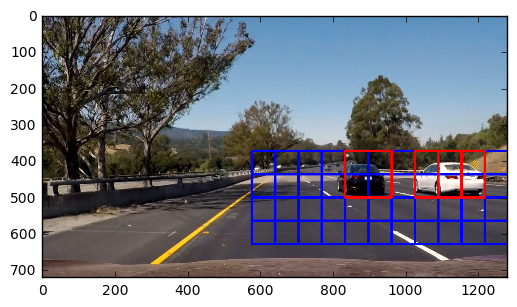

In [15]:
def find_cars(img, ystart, ystop, scale, xstart, dec_func_thresh = 1.00):
    return draw_img, box_list

dec_func_thresh = 1.00
xstart, ystart, ystop, scale = 9, 373, 720, 2. # 393, 656, 1.0

#img = mpimg.imread('test_image.jpg')
img = mpimg.imread('test_images/test23.jpg')
out_img, box_list = find_cars(img, ystart, ystop, scale, xstart, dec_func_thresh)

plt.imshow(out_img)
plt.show()

## False Positives

The overlapping window space creates multiple detections to improve the reliability of the classifier. This approach essentially creates a classifier ensemble similar to Random Forest classifiers. The final decision for car or not car is made using heat maps and a threshold function. The Add Heat function gives each pixel contained inside within a detection box a value of +1. 

This project uses a threshold value of 2.0 which means that any 2 overlapping boxes from the three levels of scaling windows will indicate a positive result for car detection. The LinearSVC Decision Function was calibrated (as above) and then it was included as a thresholding function to improve accuracy. The selected value (1.0) should reject only 3% of images as false positives. 

In [16]:
def add_heat(img, bbox_list):
    return heatmap

def apply_threshold(heatmap, threshold):
    return heatmap

def draw_labeled_bboxes(img, labels):
    return img

def draw_boxes(img, bboxes, color=(255,0,0), thick=6):
    return draw_img

## Image Pipeline

In [17]:
def initial_pipeline(img, ystart = 360, ystop = 660):        
    return out_img, heatmap, draw_img

## Image Testing

Testing Files...


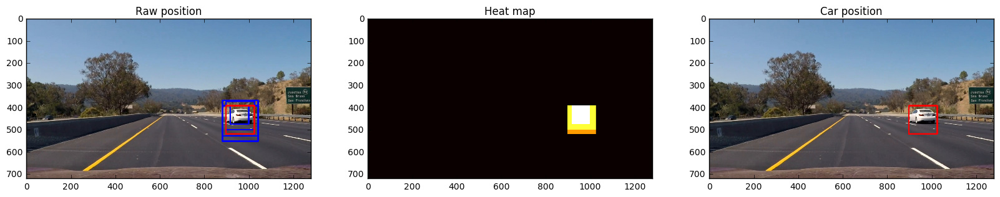

1.97 Seconds for Feature Selection...
test00.jpg
Done!


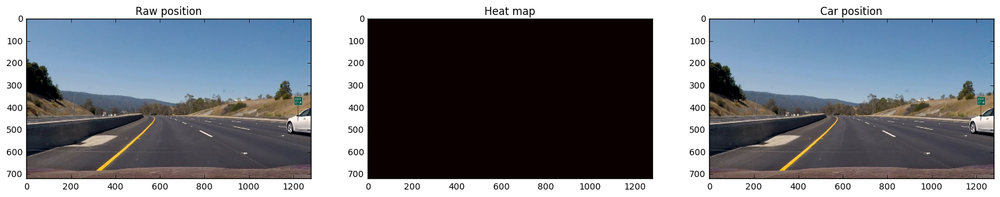

1.91 Seconds for Feature Selection...
test01.jpg
Done!


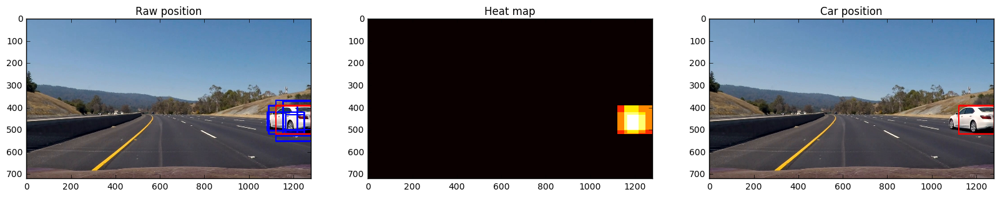

2.06 Seconds for Feature Selection...
test02.jpg
Done!


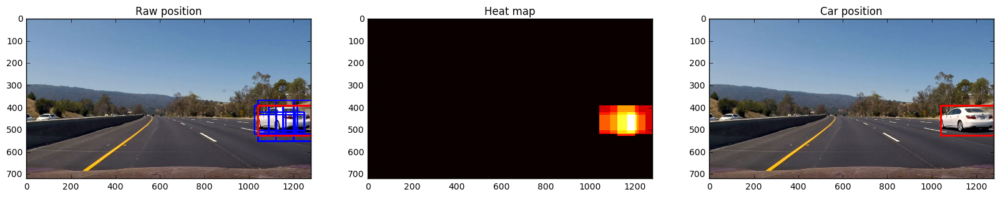

2.0 Seconds for Feature Selection...
test03.jpg
Done!


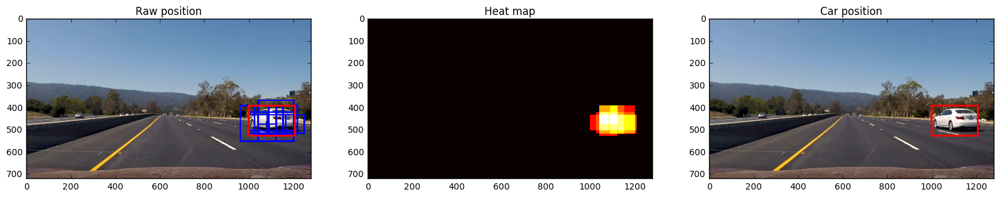

1.93 Seconds for Feature Selection...
test04.jpg
Done!


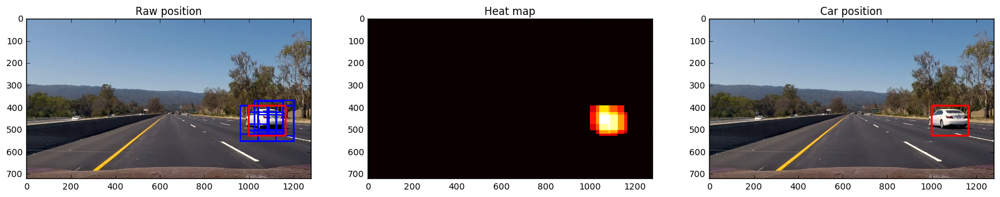

1.85 Seconds for Feature Selection...
test05.jpg
Done!


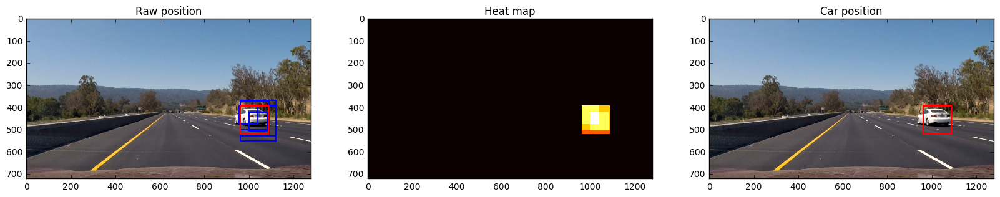

1.8 Seconds for Feature Selection...
test06.jpg
Done!


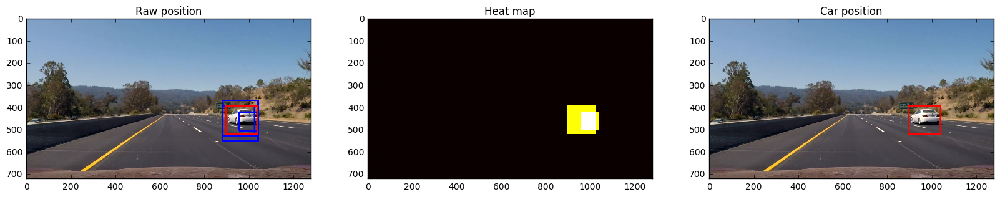

1.79 Seconds for Feature Selection...
test07.jpg
Done!


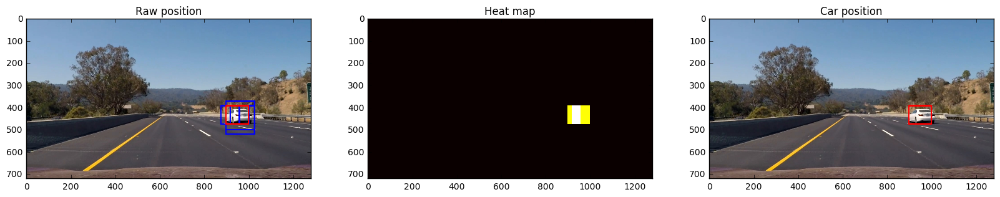

1.79 Seconds for Feature Selection...
test08.jpg
Done!


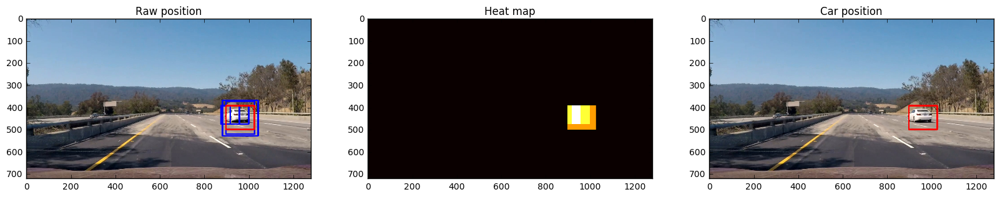

1.8 Seconds for Feature Selection...
test09.jpg
Done!


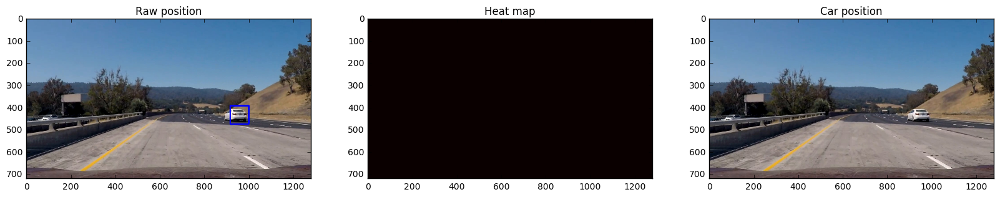

1.94 Seconds for Feature Selection...
test10.jpg
Done!


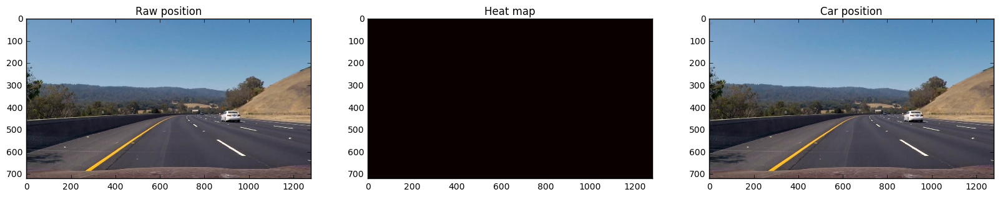

1.83 Seconds for Feature Selection...
test11.jpg
Done!


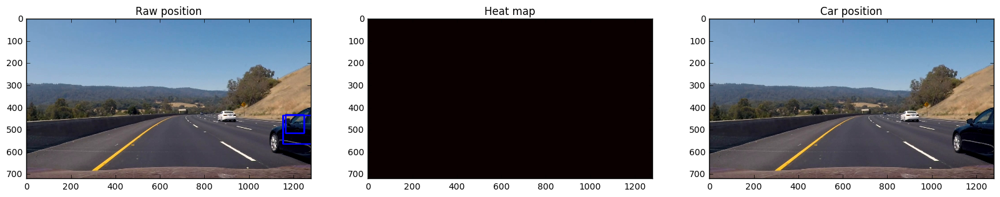

1.93 Seconds for Feature Selection...
test12.jpg
Done!


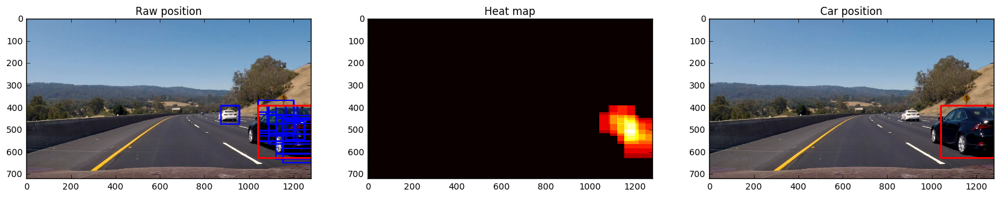

1.86 Seconds for Feature Selection...
test13.jpg
Done!


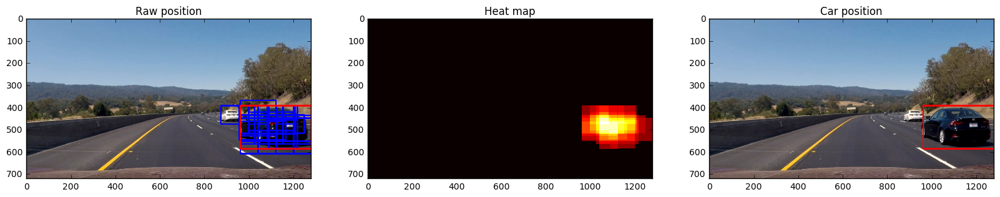

1.82 Seconds for Feature Selection...
test14.jpg
Done!


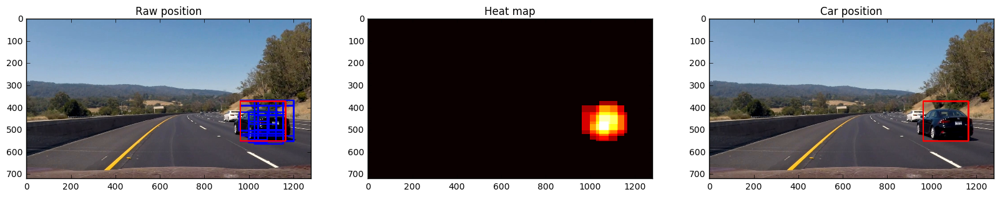

1.78 Seconds for Feature Selection...
test15.jpg
Done!


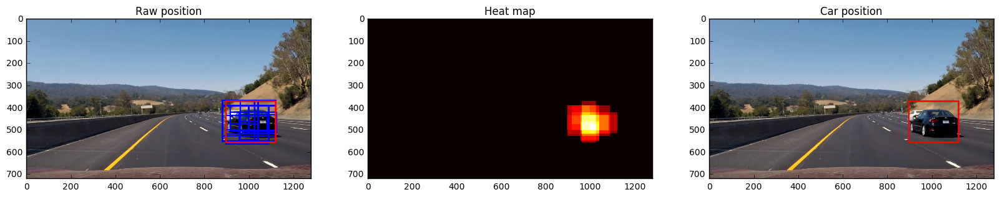

1.81 Seconds for Feature Selection...
test16.jpg
Done!


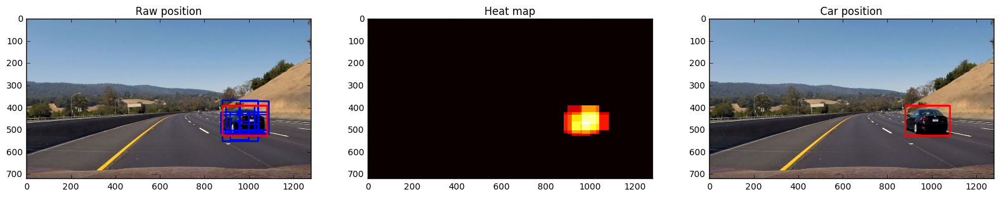

1.87 Seconds for Feature Selection...
test17.jpg
Done!


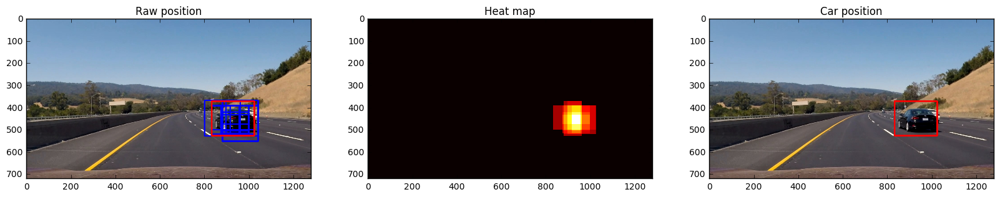

1.84 Seconds for Feature Selection...
test18.jpg
Done!


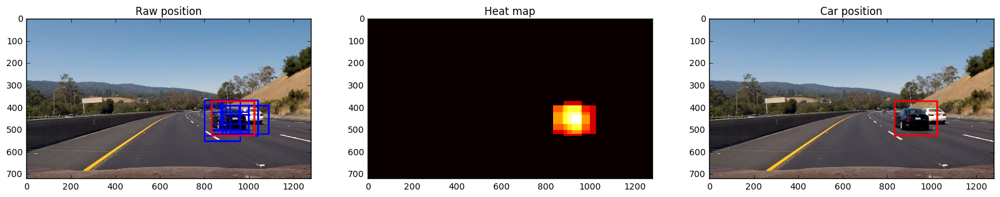

1.73 Seconds for Feature Selection...
test19.jpg
Done!


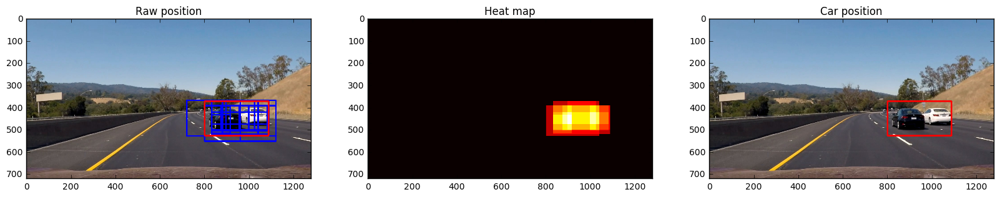

1.83 Seconds for Feature Selection...
test20.jpg
Done!


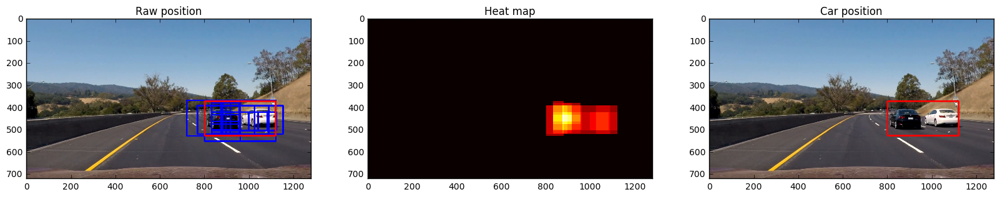

1.83 Seconds for Feature Selection...
test21.jpg
Done!


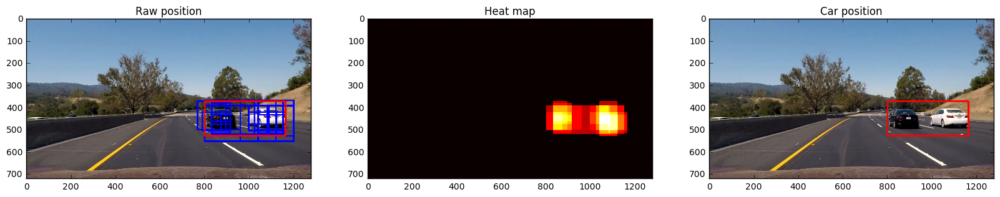

1.89 Seconds for Feature Selection...
test22.jpg
Done!


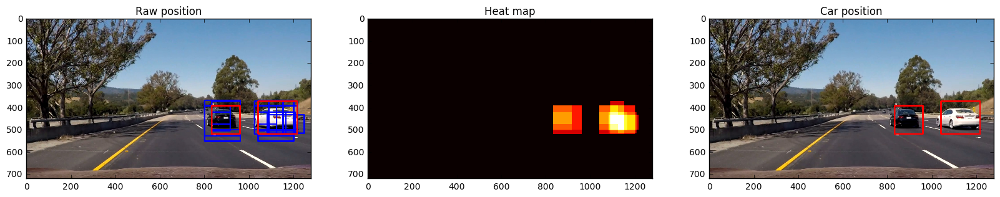

1.81 Seconds for Feature Selection...
test23.jpg
Done!


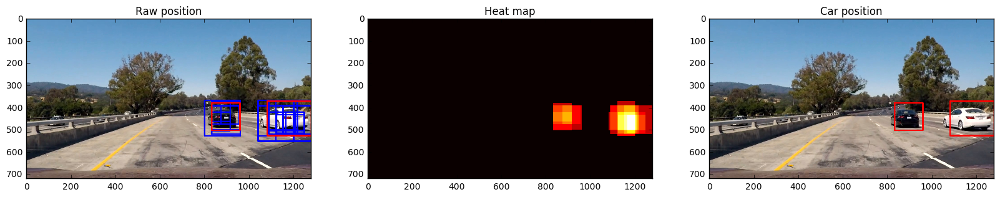

1.95 Seconds for Feature Selection...
test24.jpg
Done!


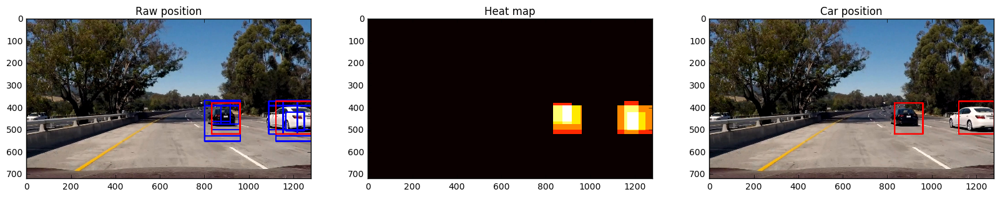

1.78 Seconds for Feature Selection...
test25.jpg
Done!


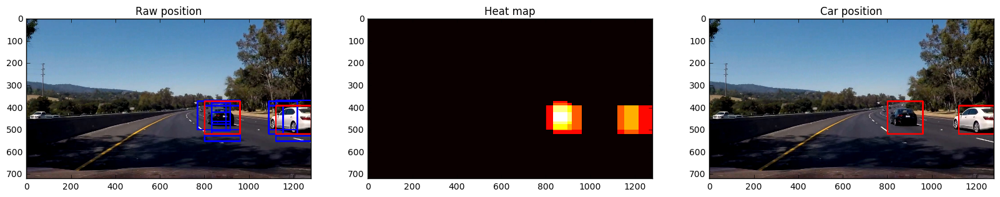

1.92 Seconds for Feature Selection...
test26.jpg
Done!


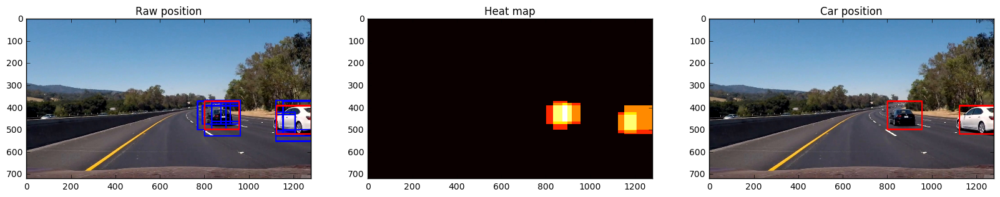

1.81 Seconds for Feature Selection...
test27.jpg
Done!


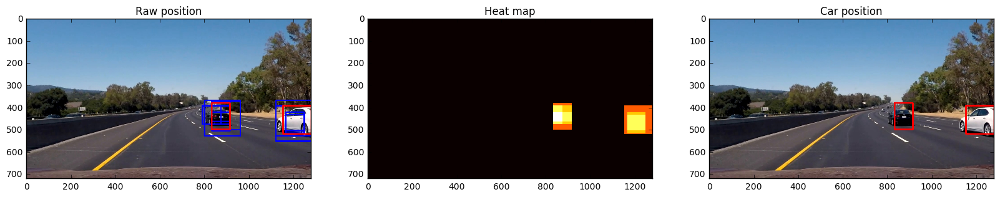

1.95 Seconds for Feature Selection...
test28.jpg
Done!


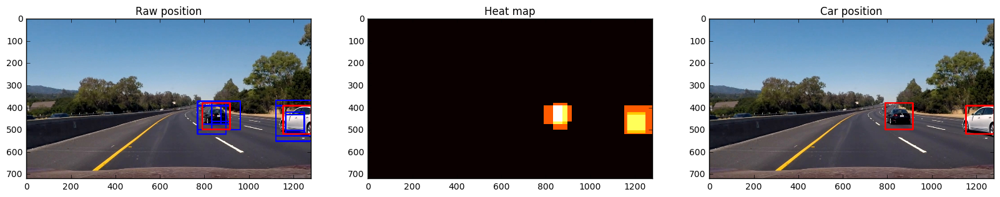

1.75 Seconds for Feature Selection...
test29.jpg
Done!


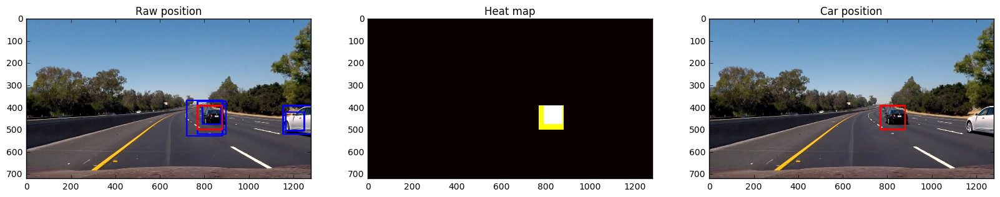

1.8 Seconds for Feature Selection...
test30.jpg
Done!


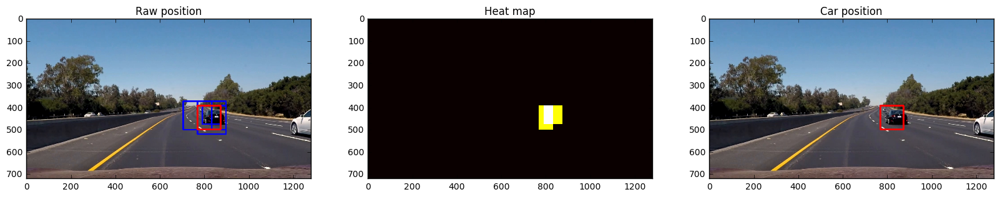

1.79 Seconds for Feature Selection...
test31.jpg
Done!


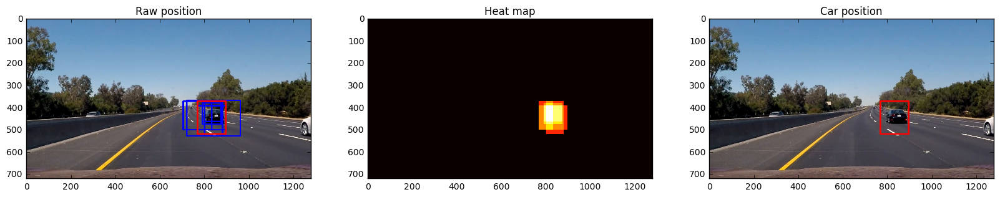

1.87 Seconds for Feature Selection...
test32.jpg
Done!


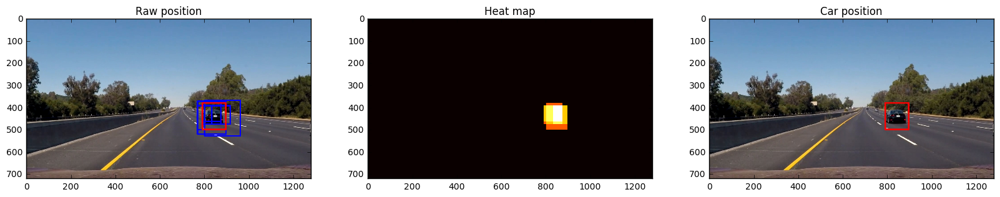

1.75 Seconds for Feature Selection...
test33.jpg
Done!


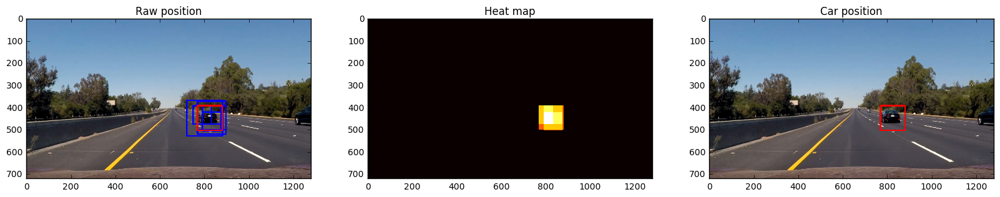

1.8 Seconds for Feature Selection...
test34.jpg
Done!


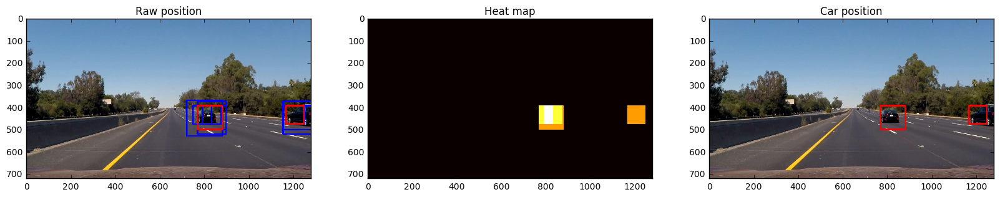

1.86 Seconds for Feature Selection...
test35.jpg
Done!


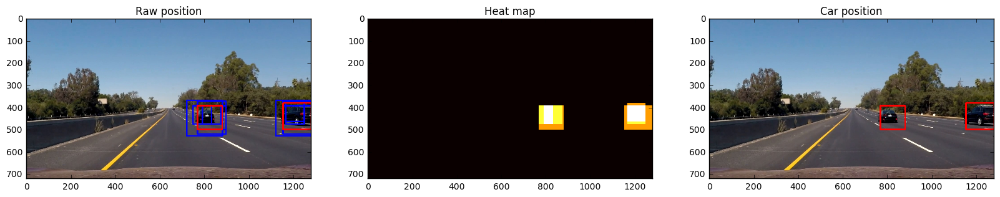

1.84 Seconds for Feature Selection...
test36.jpg
Done!


In [18]:
test_files = glob.glob('./test_images/*.jpg')

print ('Testing Files...')
for file in test_files[:37]: #[-25:]:
    t=time.time()
    img = mpimg.imread(file)
    
    out_img, heatmap, draw_img = initial_pipeline(img)

    f,(ax1,ax2,ax3) = plt.subplots(1,3,figsize =(20,10))
    ax1.imshow(out_img)
    ax2.imshow(heatmap,cmap='hot')
    ax3.imshow(draw_img)
    ax1.set_title('Raw position')
    ax2.set_title('Heat map')
    ax3.set_title('Car position')
    plt.show()
    t2 = time.time()
    print (round(t2-t, 2), 'Seconds for Feature Selection...')
    print (file[-10:])
    print ('Done!')
    #print (type(heatmap), heatmap.shape, np.max(heatmap))

## Video Pipeline

Exponential Smoothing was implemented to filter false positives.

In [19]:
heat_parms = np.zeros((720,1280))
alpha = 0.08

def final_pipeline(img):
    global heat_parms

    out_img, heatmap, _ = initial_pipeline(img)
    heat_parms = alpha*heat_parms + (1-alpha)*heatmap
    labels = label(heat_parms)
    
    draw_img = draw_labeled_bboxes(np.copy(img), labels)    
    
    return draw_img

In [20]:
from moviepy.editor import VideoFileClip

video = './project_video'
clip = VideoFileClip(video+'.mp4')
video_output = video+'_output.mp4'
video_clip = clip.fl_image(final_pipeline)
%time video_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video ./project_video_output.mp4
[MoviePy] Writing video ./project_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [18:32<00:00,  1.12it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_video_output.mp4 

Wall time: 18min 33s


## Optional Challenge

The software pipeline for Vehicle Detction was combined with the code for Advanced Lane Detection using the code shown below.

In [ ]:
import P5_10 as P5
result, out_img, heatmap, heat_parms = P5.final_pipeline_merge(undist_img, result)

heat_parms = np.zeros((720,1280))
alpha = 0.2

def final_pipeline_merge(img, result):
    global heat_parms

    out_img, heatmap, _ = initial_pipeline(img)
    heat_parms = alpha*heat_parms + (1-alpha)*heatmap
    labels = label(heat_parms)
    
    draw_img = draw_labeled_bboxes(np.copy(result), labels)    
    
    return draw_img, out_img, heatmap, heat_parms

## Discussion

The biggest challenge was working with the HOG feature extraction function. I over generalized the code to always return HOG Features and HOG Images. It took me some time to figure out why the speed for Feature Extraction slowed down by a 10X factor! HOG Images are great for visualization, but they are also very computationally expensive.

I’m very happy with the results of this project. The only improvements that I can think of would be to write the code in C++ (for speed), add centroid tracking to really be sure where other vehicles are and predict their movements, and to add training data from additional vehicles and driving conditions.